In [131]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
import nltk
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
from collections import Counter
from nltk.stem.snowball import SnowballStemmer
stemmer = SnowballStemmer("english")
from nltk.stem import WordNetLemmatizer 
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import string
import nltk
#nltk.download('wordnet')
from sklearn.cluster import MiniBatchKMeans
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import nltk.sentiment.vader as vd
from nltk import download
from geopy.geocoders import Nominatim
from collections import Counter

In [132]:
df=pd.read_csv("../data/FakeCovid.csv", delimiter=",")
#data1 = data1[(data1['Created At (UTC)'] > '2020-03-01 00:00:00') & (data1['Created At (UTC)'] <= '2020-03-21 23:59:59')]
df['published_date']=pd.to_datetime(df['published_date'])
df.head()

,FCID,article_source,category,class,content_text,country,country1,country2,country3,country4,...,ref_url,source_title,verifiedby,SM_Link,twitter_url,youtube_url,instagram_url,facebook_url,pinterest_url,reddit_url
0,FC0,https://www.nacion.com/no-coma-cuento/nocomacu...,NaN,FALSE,¿Desea activar las notificaciones en el escrit...,Costa Rica,Costa Rica,NaN,NaN,NaN,...,https://www.poynter.org/?ifcn_misinformation=c...,#NoComaCuento: Bomberos no tiene reportes de c...,La Nación,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,FC1,https://pagellapolitica.it/bufale/show/988/not...,NaN,FALSE,Questa è una comunicazione falsa smentita dal ...,Italy,Italy,NaN,NaN,NaN,...,https://www.poynter.org/?ifcn_misinformation=t...,Notizia falsa: la comunicazione della Protezio...,Pagella Politica,NaN,https://twitter.com/DPCgov/status/123736513529...,NaN,NaN,https://www.facebook.com/simone.garau.969/post...,NaN,NaN
2,FC2,fullfact.org/online/coronavirus-lift/,Viral Post,FALSE,"Speak Now, A picture of what looks like clothe...",India,India,NaN,NaN,NaN,...,https://www.poynter.org/?ifcn_misinformation=p...,Fact Check: Fake claim of China shipping cloth...,India Today,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,FC3,https://maldita.es/malditobulo/cerdos-coronavi...,NaN,FALSE,Este vídeo tiene dos clips. Primero vemos vari...,Spain,Spain,NaN,NaN,NaN,...,https://www.poynter.org/?ifcn_misinformation=p...,"No, estos vídeos de cerdos enterrados vivos no...",Maldita.es,NaN,NaN,https://www.youtube.com/watch?time_continue=21...,NaN,https://www.facebook.com/man.moliu.9/videos/60...,NaN,NaN
4,FC4,https://www.newtral.es/es-falso-que-este-video...,NaN,FALSE,Un vídeo se está difundiendo en redes en el qu...,Spain,Spain,NaN,NaN,NaN,...,https://www.poynter.org/?ifcn_misinformation=v...,El falso vídeo que muestra a “médicos” que “ca...,Newtral.es,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [133]:
df['twitter_url'] = df['twitter_url'].replace(np.nan, '', regex=True)
df['youtube_url'] = df['youtube_url'].replace(np.nan, '', regex=True)
df['facebook_url'] = df['facebook_url'].replace(np.nan, '', regex=True)
df['instagram_url'] = df['instagram_url'].replace(np.nan, '', regex=True)
df['pinterest_url'] = df['pinterest_url'].replace(np.nan, '', regex=True)
df['reddit_url'] = df['reddit_url'].replace(np.nan, '', regex=True)
df.head()

,FCID,article_source,category,class,content_text,country,country1,country2,country3,country4,...,ref_url,source_title,verifiedby,SM_Link,twitter_url,youtube_url,instagram_url,facebook_url,pinterest_url,reddit_url
0,FC0,https://www.nacion.com/no-coma-cuento/nocomacu...,NaN,FALSE,¿Desea activar las notificaciones en el escrit...,Costa Rica,Costa Rica,NaN,NaN,NaN,...,https://www.poynter.org/?ifcn_misinformation=c...,#NoComaCuento: Bomberos no tiene reportes de c...,La Nación,NaN,,,,,,
1,FC1,https://pagellapolitica.it/bufale/show/988/not...,NaN,FALSE,Questa è una comunicazione falsa smentita dal ...,Italy,Italy,NaN,NaN,NaN,...,https://www.poynter.org/?ifcn_misinformation=t...,Notizia falsa: la comunicazione della Protezio...,Pagella Politica,NaN,https://twitter.com/DPCgov/status/123736513529...,,,https://www.facebook.com/simone.garau.969/post...,,
2,FC2,fullfact.org/online/coronavirus-lift/,Viral Post,FALSE,"Speak Now, A picture of what looks like clothe...",India,India,NaN,NaN,NaN,...,https://www.poynter.org/?ifcn_misinformation=p...,Fact Check: Fake claim of China shipping cloth...,India Today,NaN,,,,,,
3,FC3,https://maldita.es/malditobulo/cerdos-coronavi...,NaN,FALSE,Este vídeo tiene dos clips. Primero vemos vari...,Spain,Spain,NaN,NaN,NaN,...,https://www.poynter.org/?ifcn_misinformation=p...,"No, estos vídeos de cerdos enterrados vivos no...",Maldita.es,NaN,,https://www.youtube.com/watch?time_continue=21...,,https://www.facebook.com/man.moliu.9/videos/60...,,
4,FC4,https://www.newtral.es/es-falso-que-este-video...,NaN,FALSE,Un vídeo se está difundiendo en redes en el qu...,Spain,Spain,NaN,NaN,NaN,...,https://www.poynter.org/?ifcn_misinformation=v...,El falso vídeo que muestra a “médicos” que “ca...,Newtral.es,NaN,,,,,,


In [134]:
df['SM_Link'] = df['SM_Link'].astype(str)
df['twitter_url'] = df['twitter_url'].astype(str)
df['youtube_url'] = df['youtube_url'].astype(str)
df['facebook_url'] = df['facebook_url'].astype(str)
df['instagram_url'] = df['instagram_url'].astype(str)
df['pinterest_url'] = df['pinterest_url'].astype(str)
df['reddit_url'] = df['reddit_url'].replace(np.nan, '', regex=True)

In [135]:
for i, row in df.iterrows():
    if row['twitter_url'] != '' :
        #df.at[i,'SM_Link']= str(row['SM_Link']) + ',' + str(row['twitter_url'])
        df.at[i,'SM_Link']= "twitter"
        print(df.at[i,'SM_Link'])
"""
   if row['facebook_url'] != '' :
        #df.at[i,'SM_Link']= str(row['SM_Link']) + ',' + str(row['twitter_url'])
        df.at[i,'SM_Link']=  str(row['SM_Link']) + ',' + "facebook"
        #print(df.at[i,'SM_Link'])    
    if row['youtube_url'] != '' :
        #df.at[i,'SM_Link']= str(row['SM_Link']) + ',' + str(row['twitter_url'])
        df.at[i,'SM_Link']=  str(row['SM_Link']) + ',' + "youtube"
        #print(df.at[i,'SM_Link'])
    if row['reddit_url'] != '' :
        #df.at[i,'SM_Link']= str(row['SM_Link']) + ',' + str(row['twitter_url'])
        df.at[i,'SM_Link']=  str(row['SM_Link']) + ',' + "reddit"
        #print(df.at[i,'SM_Link'])    
    if row['instagram_url'] != '' :
        #df.at[i,'SM_Link']= str(row['SM_Link']) + ',' + str(row['twitter_url'])
        df.at[i,'SM_Link']=  str(row['SM_Link']) + ',' + "instagram"
        print(df.at[i,'SM_Link'])""" 

twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter
twitter


'\n   if row[\'facebook_url\'] != \'\' :\n        #df.at[i,\'SM_Link\']= str(row[\'SM_Link\']) + \',\' + str(row[\'twitter_url\'])\n        df.at[i,\'SM_Link\']=  str(row[\'SM_Link\']) + \',\' + "facebook"\n        #print(df.at[i,\'SM_Link\'])    \n    if row[\'youtube_url\'] != \'\' :\n        #df.at[i,\'SM_Link\']= str(row[\'SM_Link\']) + \',\' + str(row[\'twitter_url\'])\n        df.at[i,\'SM_Link\']=  str(row[\'SM_Link\']) + \',\' + "youtube"\n        #print(df.at[i,\'SM_Link\'])\n    if row[\'reddit_url\'] != \'\' :\n        #df.at[i,\'SM_Link\']= str(row[\'SM_Link\']) + \',\' + str(row[\'twitter_url\'])\n        df.at[i,\'SM_Link\']=  str(row[\'SM_Link\']) + \',\' + "reddit"\n        #print(df.at[i,\'SM_Link\'])    \n    if row[\'instagram_url\'] != \'\' :\n        #df.at[i,\'SM_Link\']= str(row[\'SM_Link\']) + \',\' + str(row[\'twitter_url\'])\n        df.at[i,\'SM_Link\']=  str(row[\'SM_Link\']) + \',\' + "instagram"\n        print(df.at[i,\'SM_Link\'])'

In [136]:
for i, row in df.iterrows():
    if row['facebook_url'] != '' :
        #df.at[i,'SM_Link']= str(row['SM_Link']) + ',' + str(row['twitter_url'])
        df.at[i,'SM_Link']=  str(row['SM_Link']) + ',' + "facebook"
        print(df.at[i,'SM_Link']) 
"""
if row['youtube_url'] != '' :
        #df.at[i,'SM_Link']= str(row['SM_Link']) + ',' + str(row['twitter_url'])
        df.at[i,'SM_Link']=  str(row['SM_Link']) + ',' + "youtube"
        #print(df.at[i,'SM_Link'])
    if row['reddit_url'] != '' :
        #df.at[i,'SM_Link']= str(row['SM_Link']) + ',' + str(row['twitter_url'])
        df.at[i,'SM_Link']=  str(row['SM_Link']) + ',' + "reddit"
        #print(df.at[i,'SM_Link'])    
    if row['instagram_url'] != '' :
        #df.at[i,'SM_Link']= str(row['SM_Link']) + ',' + str(row['twitter_url'])
        df.at[i,'SM_Link']=  str(row['SM_Link']) + ',' + "instagram"
        print(df.at[i,'SM_Link'])
"""        

twitter,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
twitter,facebook
nan,facebook
twitter,facebook
nan,facebook
nan,facebook
nan,facebook
twitter,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
twitter,facebook
nan,facebook
nan,facebook
nan,facebook
twitter,facebook
nan,facebook
nan,facebook
nan,facebook
twitter,facebook
twitter,facebook
nan,facebook
nan,facebook
nan,facebook
twitter,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
twitter,facebook
twitter,facebook
nan,facebook
nan,facebook
nan,facebook
twitter,facebook
nan,facebook
nan,facebook
twitter,facebook
twitter,facebook
nan,facebook
twitter,facebook
nan,facebook
nan,facebook
twitter,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
twitter,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
twitter,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,f

nan,facebook
twitter,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
twitter,facebook
nan,facebook
nan,facebook
twitter,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
twitter,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
twitter,facebook
nan,facebook
nan,facebook
twitter,facebook
nan,facebook
twitter,facebook
twitter,facebook
twitter,facebook
nan,facebook
nan,facebook
nan,facebook
twitter,facebook
nan,facebook
nan,facebook
twitter,facebook
nan,facebook
twitter,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
twitter,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
twitter,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
twitter,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,

nan,facebook
twitter,facebook
nan,facebook
twitter,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
twitter,facebook
nan,facebook
twitter,facebook
twitter,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
twitter,facebook
twitter,facebook
twitter,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
twitter,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
twitter,facebook
nan,facebook
nan,facebook
twitter,facebook
nan,facebook
twitter,facebook
nan,facebook
twitter,facebook
nan,facebook
twitter,facebook
twitter,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
nan,facebook
twitter,facebook


'\nif row[\'youtube_url\'] != \'\' :\n        #df.at[i,\'SM_Link\']= str(row[\'SM_Link\']) + \',\' + str(row[\'twitter_url\'])\n        df.at[i,\'SM_Link\']=  str(row[\'SM_Link\']) + \',\' + "youtube"\n        #print(df.at[i,\'SM_Link\'])\n    if row[\'reddit_url\'] != \'\' :\n        #df.at[i,\'SM_Link\']= str(row[\'SM_Link\']) + \',\' + str(row[\'twitter_url\'])\n        df.at[i,\'SM_Link\']=  str(row[\'SM_Link\']) + \',\' + "reddit"\n        #print(df.at[i,\'SM_Link\'])    \n    if row[\'instagram_url\'] != \'\' :\n        #df.at[i,\'SM_Link\']= str(row[\'SM_Link\']) + \',\' + str(row[\'twitter_url\'])\n        df.at[i,\'SM_Link\']=  str(row[\'SM_Link\']) + \',\' + "instagram"\n        print(df.at[i,\'SM_Link\'])\n'

In [137]:
for i, row in df.iterrows():
    if row['instagram_url'] != '' :
        #df.at[i,'SM_Link']= str(row['SM_Link']) + ',' + str(row['twitter_url'])
        df.at[i,'SM_Link']=  str(row['SM_Link']) + ',' + "instagram"
        print(df.at[i,'SM_Link']) 

nan,instagram
twitter,instagram
nan,instagram
nan,facebook,instagram
nan,facebook,instagram
twitter,facebook,instagram
nan,facebook,instagram
nan,facebook,instagram
twitter,facebook,instagram
twitter,instagram
nan,instagram
nan,instagram
twitter,facebook,instagram
nan,facebook,instagram
nan,facebook,instagram
twitter,instagram
twitter,facebook,instagram
nan,facebook,instagram
nan,instagram
twitter,instagram
nan,facebook,instagram
twitter,instagram
twitter,instagram
nan,facebook,instagram
nan,facebook,instagram
twitter,instagram
twitter,instagram
twitter,instagram
twitter,facebook,instagram
twitter,facebook,instagram
nan,instagram
nan,instagram
twitter,instagram
nan,facebook,instagram
nan,instagram
twitter,facebook,instagram
nan,facebook,instagram
nan,facebook,instagram
nan,instagram
twitter,instagram
nan,instagram
twitter,facebook,instagram
twitter,instagram
nan,instagram
nan,facebook,instagram
twitter,facebook,instagram
nan,facebook,instagram
nan,instagram
nan,facebook,instagram
nan,i

In [138]:
for i, row in df.iterrows():
    if row['youtube_url'] != '' :
        #df.at[i,'SM_Link']= str(row['SM_Link']) + ',' + str(row['twitter_url'])
        df.at[i,'SM_Link']=  str(row['SM_Link']) + ',' + "youtube"
        print(df.at[i,'SM_Link']) 

nan,facebook,youtube
nan,facebook,youtube
nan,facebook,youtube
nan,facebook,youtube
twitter,youtube
nan,facebook,youtube
twitter,instagram,youtube
nan,facebook,youtube
twitter,youtube
twitter,facebook,youtube
nan,youtube
twitter,facebook,youtube
nan,youtube
twitter,youtube
nan,youtube
nan,facebook,youtube
nan,facebook,youtube
nan,youtube
nan,youtube
nan,youtube
nan,youtube
twitter,youtube
nan,facebook,youtube
twitter,youtube
nan,youtube
nan,youtube
twitter,facebook,youtube
twitter,facebook,youtube
nan,facebook,youtube
nan,youtube
nan,youtube
nan,youtube
nan,youtube
nan,facebook,youtube
nan,youtube
nan,facebook,youtube
nan,facebook,youtube
nan,facebook,youtube
nan,youtube
nan,facebook,youtube
nan,facebook,youtube
nan,youtube
nan,facebook,youtube
nan,youtube
twitter,facebook,youtube
nan,youtube
twitter,youtube
nan,youtube
twitter,instagram,youtube
nan,facebook,youtube
twitter,youtube
nan,youtube
nan,youtube
nan,youtube
twitter,facebook,instagram,youtube
twitter,facebook,youtube
nan,faceb

In [139]:
for i, row in df.iterrows():
    if row['reddit_url'] != '' :
        #df.at[i,'SM_Link']= str(row['SM_Link']) + ',' + str(row['twitter_url'])
        df.at[i,'SM_Link']=  str(row['SM_Link']) + ',' + "reddit"
        print(df.at[i,'SM_Link']) 

nan,instagram,reddit
nan,facebook,reddit
nan,reddit
nan,facebook,reddit
twitter,facebook,reddit
nan,reddit
nan,facebook,youtube,reddit
nan,facebook,reddit
nan,reddit
twitter,reddit
nan,facebook,reddit
nan,reddit
nan,facebook,reddit
nan,facebook,instagram,reddit
nan,reddit
twitter,reddit
nan,facebook,youtube,reddit
nan,facebook,reddit
nan,facebook,reddit
nan,facebook,youtube,reddit
twitter,facebook,reddit
nan,reddit
nan,facebook,reddit
nan,facebook,reddit
nan,reddit
twitter,reddit
twitter,reddit
nan,facebook,reddit
nan,reddit


In [142]:
df1=df.drop(['facebook_url', 'reddit_url','youtube_url','twitter_url','instagram_url', 'pinterest_url'], axis=1)
df1.head()

In [143]:
df1.to_csv("fakecovid.csv")

In [52]:
"""df['FCID']=df.index
df['FCID'] = 'FC' + df['FCID'].astype(str)
#df=df.sort_values(by=['FID'])
df.head()
"""

"df['FCID']=df.index\ndf['FCID'] = 'FC' + df['FCID'].astype(str)\n#df=df.sort_values(by=['FID'])\ndf.head()\n"

In [11]:
'''df['FID']=df['FID'].astype(str)
for i,row in df.iterrows():
    id="FC"+str(i)
    df.set_value(i,'FID',id)
    print(df.set_value(i,'FID',id))
    '''

'df[\'FID\']=df[\'FID\'].astype(str)\nfor i,row in df.iterrows():\n    id="FC"+str(i)\n    df.set_value(i,\'FID\',id)\n    print(df.set_value(i,\'FID\',id))\n    '

In [21]:
df["verifiedby"].describe()

count     5180
unique      92
top        AFP
freq       485
Name: verifiedby, dtype: object

In [22]:
df["lang"].describe()

count        4922
unique         40
top       English
freq         2116
Name: lang, dtype: object

In [23]:
df.shape

(5182, 18)

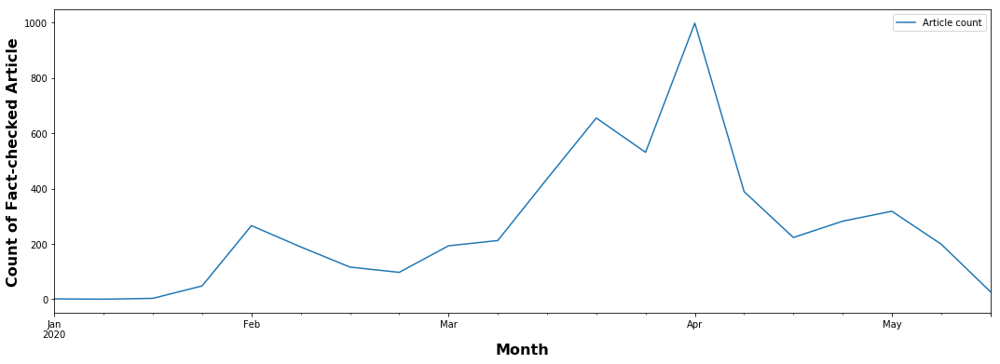

In [24]:
# histogram of the weight
df_5min = df.groupby(pd.Grouper(key='published_date', freq='1w', convention='start')).size()
df_5min.plot(figsize=(18,6))
plt.ylabel('Count of Fact-checked Article', fontsize=16, weight='bold')
plt.xlabel('Month', fontsize=16, weight='bold')
plt.legend(["Article count"]);
plt.grid(False)

In [25]:
df['published_date'].min()

Timestamp('2020-01-04 00:00:00')

In [26]:
df['published_date'].max()

Timestamp('2020-05-15 00:00:00')

In [27]:
df['country1']= df['country1'].replace('DR Congo', "Democratic Republic of the Congo")
df['country2']= df['country2'].replace('DR Congo', "Democratic Republic of the Congo")
df['country3']= df['country3'].replace('DR Congo', "Democratic Republic of the Congo")
df['country4']= df['country4'].replace('DR Congo', "Democratic Republic of the Congo")
df['country1']= df['country1'].replace('Congo', "Democratic Republic of the Congo")
df['country2']= df['country2'].replace('Congo', "Democratic Republic of the Congo")
df['country3']= df['country3'].replace('Congo', "Democratic Republic of the Congo")
df['country4']= df['country4'].replace('Congo', "Democratic Republic of the Congo")
df['country1']= df['country1'].replace('México', "Mexico")
df['country2']= df['country2'].replace('México', "Mexico")
df['country3']= df['country3'].replace('México', "Mexico")
df['country4']= df['country4'].replace('México', "Mexico")

In [28]:
country1=df['country1'].to_list()
country2=df['country2'].to_list()
country3=df['country3'].to_list()
country4=df['country4'].to_list()

In [29]:
country = country1 + country2 + country3 + country4

In [30]:
counts = Counter(country)
#del counts[nan]
counts

Counter({'Costa Rica': 25,
         'Italy': 111,
         'India': 1083,
         'Spain': 426,
         'United States': 677,
         'Australia': 67,
         'Taiwan': 132,
         'Sri Lanka': 99,
         'Bolivia': 28,
         'Colombia': 151,
         'Argentina': 59,
         'France': 229,
         'Ukraine': 31,
         'Portugal': 50,
         'Netherlands': 15,
         'Myanmar': 42,
         'Ecuador': 61,
         'Brazil': 283,
         'Kenya': 79,
         'Denmark': 30,
         'Mexico': 110,
         'Philippines': 157,
         'Nigeria': 89,
         'West Africa': 13,
         nan: 15168,
         'North Macedonia': 64,
         'Indonesia': 97,
         'Middle East': 133,
         'Kazakhstan': 17,
         'Germany': 53,
         'Serbia': 20,
         'Latvia': 12,
         'Turkey': 126,
         'Croatia': 60,
         'Poland': 32,
         'Singapore': 11,
         'Thailand': 35,
         'Madagascar': 11,
         'Paraguay': 13,
         'Lithuan

In [31]:
df_c=pd.read_csv("../data/unique_country.txt", delimiter=",")
#data1 = data1[(data1['Created At (UTC)'] > '2020-03-01 00:00:00') & (data1['Created At (UTC)'] <= '2020-03-21 23:59:59')]
df_c=df_c.sort_values(by='count', ascending=False)
df_c.head(13)

,country,count
116,NaN,15168
1,India,1083
11,United States,677
5,Spain,426
4,Brazil,283
0,France,229
6,Philippines,157
17,Colombia,151
105,Middle East,133
28,Taiwan,132


In [15]:
"""import operator
from operator import itemgette
res = dict(sorted(counts.items(), key = itemgetter(1), reverse = True)[:10]) 
res
"""
from heapq import nlargest 
TenHighest = nlargest(14, counts, key = counts.get) 
TenHighest

[nan,
 'India',
 'United States',
 'Spain',
 'Brazil',
 'France',
 'Philippines',
 'Colombia',
 'Middle East',
 'Taiwan',
 'North Africa',
 'Turkey',
 'Italy',
 'Mexico']

In [32]:
#plt.bar(range(len(counts)), list(counts.values()), align='center')
#plt.xticks(range(len(counts)), list(counts.keys()))
# # for python 2.x:
# plt.bar(range(len(D)), D.values(), align='center')  # python 2.x
# plt.xticks(range(len(D)), D.keys())  # in python 2.x

#plt.show()

In [28]:
"""
df["lang"]= df["lang"].replace('en', "English")
df["lang"]= df["lang"].replace('es', "Spanish")
df["lang"]= df["lang"].replace('fr', "French")
df["lang"]= df["lang"].replace('pt', "Portuguese")
df["lang"]= df["lang"].replace('tr', "Turkish")
df["lang"]= df["lang"].replace('hi', "Hindi")
df["lang"]= df["lang"].replace('zh-tw', "Chinese")
df["lang"]= df["lang"].replace('hr', "Croatian")
df["lang"]= df["lang"].replace('te', "Telugu")
df["lang"]= df["lang"].replace('it', "Italian")
df["lang"]= df["lang"].replace('mk', "Macedonian")
df["lang"]= df["lang"].replace('de', "German")
df["lang"]= df["lang"].replace('ar', "Arabic")
df["lang"]= df["lang"].replace('id', "Indonesian")
df["lang"]= df["lang"].replace('ml', "Malayalam")
df["lang"]= df["lang"].replace('ja', "Japanese")
df["lang"]= df["lang"].replace('ta', "Tamil")
df["lang"]= df["lang"].replace('ko', "Korean")
df["lang"]= df["lang"].replace('lt', "Lithuanian")
df["lang"]= df["lang"].replace('pl', "Polish")
df["lang"]= df["lang"].replace('da', "Danish")
df["lang"]= df["lang"].replace('mr', "Marathi")
df["lang"]= df["lang"].replace('tl', "Tagalog")
df["lang"]= df["lang"].replace('ru', "Russian")
df["lang"]= df["lang"].replace('nl', "Dutch")
df["lang"]= df["lang"].replace('fa', "Persian")
df["lang"]= df["lang"].replace('bn', "Bengali")
df["lang"]= df["lang"].replace('el', "Greek")
df["lang"]= df["lang"].replace('lv', "Latvian")
df["lang"]= df["lang"].replace('gu', "Gujarati")
df["lang"]= df["lang"].replace('et', "Estonian")
df["lang"]= df["lang"].replace('uk', "Ukrainian")
df["lang"]= df["lang"].replace('ur', "Urdu")
df["lang"]= df["lang"].replace('th', "Thai")
df["lang"]= df["lang"].replace('ca', "Catalan")
df["lang"]= df["lang"].replace('vi', "Vietnamese")
df["lang"]= df["lang"].replace('fi', "Finnish")
"""

'\ndf["lang"]= df["lang"].replace(\'en\', "English")\ndf["lang"]= df["lang"].replace(\'es\', "Spanish")\ndf["lang"]= df["lang"].replace(\'fr\', "French")\ndf["lang"]= df["lang"].replace(\'pt\', "Portuguese")\ndf["lang"]= df["lang"].replace(\'tr\', "Turkish")\ndf["lang"]= df["lang"].replace(\'hi\', "Hindi")\ndf["lang"]= df["lang"].replace(\'zh-tw\', "Chinese")\ndf["lang"]= df["lang"].replace(\'hr\', "Croatian")\ndf["lang"]= df["lang"].replace(\'te\', "Telugu")\ndf["lang"]= df["lang"].replace(\'it\', "Italian")\ndf["lang"]= df["lang"].replace(\'mk\', "Macedonian")\ndf["lang"]= df["lang"].replace(\'de\', "German")\ndf["lang"]= df["lang"].replace(\'ar\', "Arabic")\ndf["lang"]= df["lang"].replace(\'id\', "Indonesian")\ndf["lang"]= df["lang"].replace(\'ml\', "Malayalam")\ndf["lang"]= df["lang"].replace(\'ja\', "Japanese")\ndf["lang"]= df["lang"].replace(\'ta\', "Tamil")\ndf["lang"]= df["lang"].replace(\'ko\', "Korean")\ndf["lang"]= df["lang"].replace(\'lt\', "Lithuanian")\ndf["lang"]= df["la

Text(0,0.5,'Count of data')

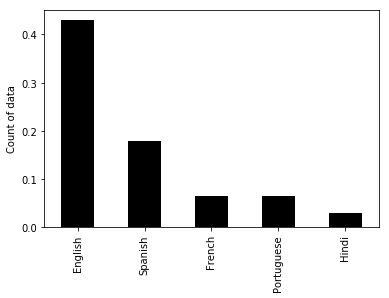

In [48]:
#df['lang'].value_counts().nlargest(10).plot(kind='bar', cmap='Greys')
ax = df['lang'].value_counts(10).nlargest().plot(kind='bar',lw=2, colormap='gist_gray')
#ax.set_xlabel("Languages")
ax.set_ylabel("Count of data")

In [49]:
df['class'].value_counts().nlargest(10)

FALSE              4132
Misleading          284
Fake                 96
misleading           59
Partially false      54
MISLEADING           49
Mostly false         39
Explanatory          35
Pants on Fire!       31
Mostly False         29
Name: class, dtype: int64

Text(0,0.5,'Count of data')

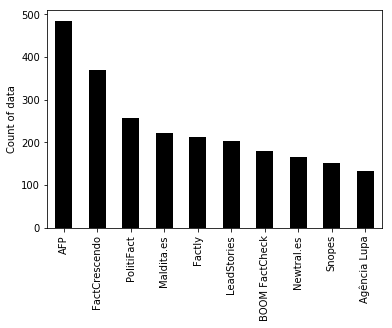

In [45]:
df["verifiedby"]= df["verifiedby"].replace('snopes', "Snopes")
#df['verifiedby'].value_counts().nlargest(10).plot(kind='bar')
#ax = df['verifiedby'].value_counts().nlargest(10).plot(kind='bar',lw=2, colormap='gist_gray', title='Top 10 County by Fact-checked Articles')
ax = df['verifiedby'].value_counts().nlargest(10).plot(kind='bar',lw=2, colormap='gist_gray')
#ax.set_xlabel("Fact-checker Organisation")
ax.set_ylabel("Count of data")

Text(0,0.5,'Count of class')

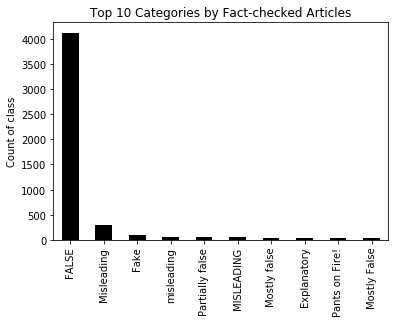

In [16]:
#df['class'].value_counts().nlargest(10).plot(kind='bar')
ax = df['class'].value_counts().nlargest(10).plot(kind='bar',lw=2, colormap='gist_gray', title='Top 10 Categories by Fact-checked Articles')
#ax.set_xlabel("Class of Fact-cheked arcticle")
ax.set_ylabel("Count of class")

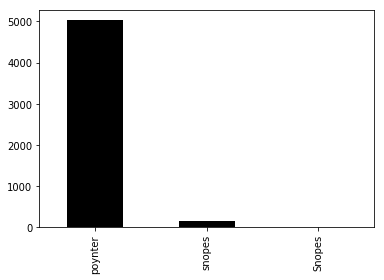

In [43]:
df['ref_source'].value_counts().plot(kind='bar',colormap='gist_gray')

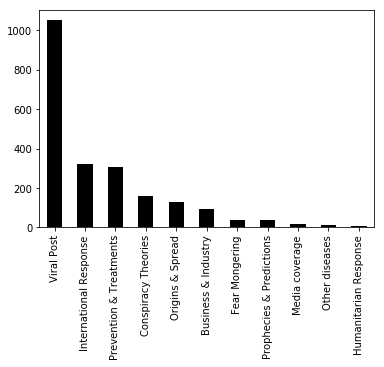

In [44]:
df['category'].value_counts().nlargest(11).plot(kind='bar',colormap='gist_gray')

In [77]:
df['lang'].value_counts().nlargest(20)

English       2116
Spanish        879
French         322
Portuguese     316
Hindi          141
Turkish        124
Italian         89
Chinese         81
Croatian        71
Telugu          70
Macedonian      59
Malayalam       57
Tamil           50
Arabic          50
Indonesian      47
German          47
Tagalog         41
Japanese        35
Korean          35
Marathi         33
Name: lang, dtype: int64

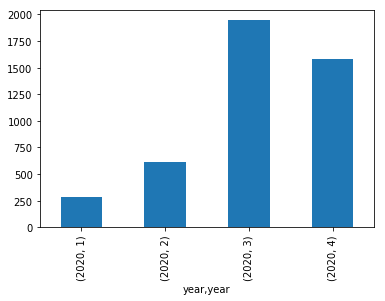

In [34]:
df['published_date'].groupby([df.published_date.dt.year.rename('year'), df.published_date.dt.month.rename('year')]).agg('count').plot(kind='bar')

In [26]:
#df1=df
#df1.set_index('published_date')
#df1.head()

In [46]:
df1=df[(df['published_date'] > '2020-01-04') & (df['published_date'] < '2020-01-31')]
df_grouped1 = (df1.groupby(['published_date']).size().reset_index(name="articles count"))
df2=df[(df['published_date'] > '2020-02-01') & (df['published_date'] < '2020-02-29')]
df_grouped2 = (df2.groupby(['published_date']).size().reset_index(name="articles count"))
df3=df[(df['published_date'] > '2020-03-01') & (df['published_date'] < '2020-03-31')]
df_grouped3 = (df3.groupby(['published_date']).size().reset_index(name="articles count"))
df4=df[(df['published_date'] > '2020-04-01') & (df['published_date'] < '2020-04-30')]
df_grouped4 = (df4.groupby(['published_date']).size().reset_index(name="articles count"))
df5=df[(df['published_date'] > '2020-05-01') & (df['published_date'] < '2020-05-31')]
df_grouped5 = (df5.groupby(['published_date']).size().reset_index(name="articles count"))
df_grouped5

,published_date,articles count
0,2020-05-02,28
1,2020-05-03,20
2,2020-05-04,32
3,2020-05-05,49
4,2020-05-06,38
5,2020-05-07,34
6,2020-05-08,32
7,2020-05-09,7
8,2020-05-10,7
9,2020-05-11,17


In [47]:
df_grouped1['date'] = df_grouped1['published_date'].dt.date
df_grouped2['date'] = df_grouped2['published_date'].dt.date
df_grouped3['date'] = df_grouped3['published_date'].dt.date
df_grouped4['date'] = df_grouped4['published_date'].dt.date
df_grouped5['date'] = df_grouped5['published_date'].dt.date

Text(0,0.5,'Number of FactCheck article')

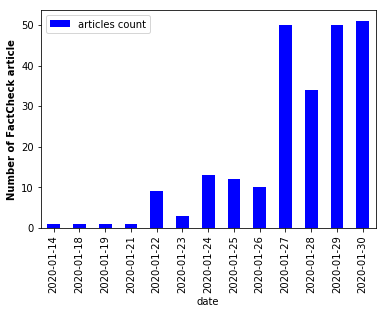

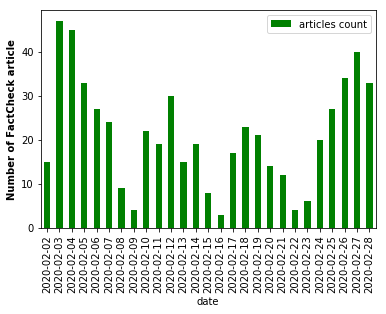

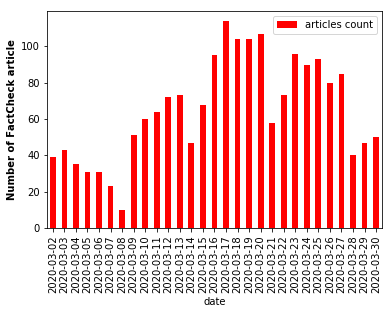

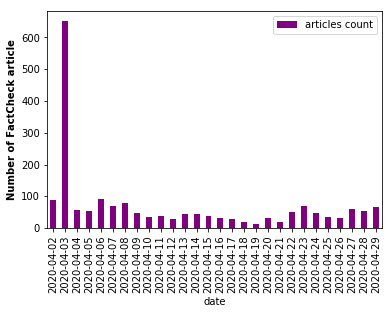

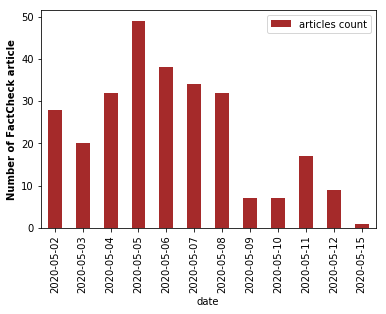

In [63]:
#https://www.earthdatascience.org/courses/use-data-open-source-python/use-time-series-data-in-python/date-time-types-in-pandas-python/customize-dates-matplotlib-plots-python/
#https://codeburst.io/plotting-with-pandas-dates-and-bar-plots-227f25351274

df_grouped1.plot.bar(x="date", y="articles count", color='blue');
plt.ylabel('Number of FactCheck article',weight='bold')
df_grouped2.plot.bar(x="date", y="articles count", color='green');
plt.ylabel('Number of FactCheck article',weight='bold')
df_grouped3.plot.bar(x="date", y="articles count", color='red');
plt.ylabel('Number of FactCheck article',weight='bold')
df_grouped4.plot.bar(x="date", y="articles count", color='purple');
plt.ylabel('Number of FactCheck article',weight='bold')
df_grouped5.plot.bar(x="date", y="articles count", color='brown');
plt.ylabel('Number of FactCheck article',weight='bold')
#plt.ylabel('ylabel')

In [64]:
text=df.content_text.str.cat(sep=' ')

In [65]:
stopwords=stopwords = nltk.corpus.stopwords.words("english")

other_exclusions = ["#ff", "ff", "rt"]
stopwords.extend(other_exclusions)

stemmer = PorterStemmer()


def preprocess(text_string):
    """
    Accepts a text string and replaces:
    1) urls with URLHERE
    2) lots of whitespace with one instance
    3) mentions with MENTIONHERE

    This allows us to get standardized counts of urls and mentions
    Without caring about specific people mentioned
    """
    space_pattern = '\s+'
    giant_url_regex = ('http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|'
        '[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+')
    mention_regex = '@[\w\-]+'
    parsed_text = re.sub(space_pattern, ' ', text_string)
    parsed_text = re.sub(giant_url_regex, '', parsed_text)
    parsed_text = re.sub(mention_regex, '', parsed_text)
    #parsed_text = parsed_text.code("utf-8", errors='ignore')
    return parsed_text

def tokenize(tweet):
    """Removes punctuation & excess whitespace, sets to lowercase,
    and stems tweets. Returns a list of stemmed tokens."""
    tweet = " ".join(re.split("[^a-zA-Z]*", tweet.lower())).strip()
    #tokens = re.split("[^a-zA-Z]*", tweet.lower())
    tokens = [stemmer.stem(t) for t in tweet.split()]
    return tokens

def basic_tokenize(tweet):
    """Same as tokenize but without the stemming"""
    tweet = " ".join(re.split("[^a-zA-Z.,!?]*", tweet.lower())).strip()
    return tweet.split()


In [66]:
p1=preprocess(text)
c1=tokenize(p1)
#c1=', '.join(c1)

In [67]:
c2 = [w for w in c1 if not w in stopwords]
c2=', '.join(c2)
c2

'naiad, director, dr, anthoni, fauci, warn, januari, trump, administr, would, face, surpris, infecti, diseas, outbreak, spring, debat, rage, timeli, effect, u, presid, donald, trump, respons, covid, coronaviru, pandem, critic, point, articl, date, shortli, befor, trump, januari, inaugur, dr, anthoni, fauci, director, nation, institut, allergi, infecti, diseas, niaid, seemingli, warn, incom, presid, would, doubt, face, surpris, infecti, diseas, outbreak, thi, imag, reflect, genuin, articl, publish, jan, nine, day, befor, trump, inaugur, headlin, fauci, doubt, trump, face, surpris, infecti, diseas, outbreak, articl, read, part, anthoni, fauci, md, director, nation, institut, allergi, infecti, diseas, said, doubt, donald, j, trump, confront, surpris, infecti, diseas, outbreak, dure, hi, presid, fauci, ha, led, niaid, decad, advis, past, five, unit, state, presid, global, health, threat, earli, day, aid, epidem, current, zika, viru, outbreak, dure, forum, pandem, prepared, georgetown, univ

In [68]:
shortword = re.compile(r'\W*\b\w{1,3}\b')
text1=shortword.sub('', c2)

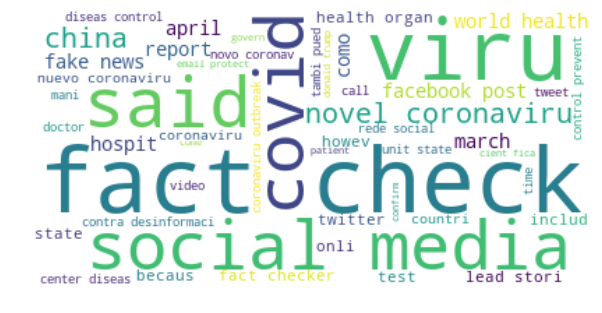

In [95]:
df.content_text=df.content_text.astype(str)
from wordcloud import WordCloud, STOPWORDS , ImageColorGenerator
# Start with all tweet
#tweet_All = " ".join(review for review in df.processed_content_text)

# Create and generate a word cloud image:
wordcloud_ALL = WordCloud(max_font_size=100, max_words=50, background_color="white").generate(text1)

plt.figure(figsize=(10, 10))
plt.imshow(wordcloud_ALL, interpolation="bilinear")
plt.axis('off')
plt.show()

In [37]:
df["category"]= df["category"].replace('U.S. Government Response', "International Response")
df["category"]= df["category"].replace('US Government Response', "International Response")
df["category"]= df["category"].replace('Trump and the Pandemic', "International Response")
df["category"]= df["category"].replace('Trump and the Pandemic II', "International Response")
df["category"]= df["category"].replace('Entertainment', "Business & Industry")
df["category"]= df["category"].replace('Entertainment', "Business & Industry")
df["category"]= df["category"].replace('Entertainment & Media', "Business & Industry")
df["category"]= df["category"].replace('Business and Industry', "Business & Industry")
df["category"]= df["category"].replace('Memes & Misinformation', "Viral Post")
df["category"]= df["category"].replace('Memes and Misinformation', "Viral Post")
df["category"]= df["category"].replace('Memes and Misinformation II', "Viral Post")
df["category"]= df["category"].replace('Viral Videos', "Viral Post")
df["category"]= df["category"].replace('Viral Video', "Viral Post")
df["category"]= df["category"].replace('Prevention and Treatments II', "Prevention & Treatments")
df["category"]= df["category"].replace('Prevention & Treatments II', "Prevention & Treatments")
df["category"]= df["category"].replace('Prevention and Treatments', "Prevention & Treatments")
df["category"]= df["category"].replace('Origins and Spread', "Origins & Spread")
df["category"]= df["category"].replace('Prophecies and Predictions', "Prophecies & Predictions")

In [38]:
df['category'].value_counts()

Viral Post                  1050
International Response       322
Prevention & Treatments      304
Conspiracy Theories          160
Origins & Spread             127
Business & Industry           96
Fear Mongering                40
Prophecies & Predictions      40
Media coverage                18
Other diseases                13
Humanitarian Response          9
Name: category, dtype: int64

In [40]:
df.to_csv("../data/Final_factcheck_Poynter_Snopes_19052020.csv", index=False)